**Цель исследования**

Подготовить исследование заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего места для открытия заведения общественного питания в Москве.

### Загрузим данные и изучим общую информацию

In [1]:
import pandas as pd
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод**

Мы имеем датафрейм с 8406 заведениями общественного питания в Москве. Часть информации отсутствует в следущих столбцах:
- hours
- price
- avg_bill
- middle_avg_bill
- middle_coffee_cup
- seats

Поэтому оценим необходимость пропущенных данных для дальнейшего исследования.
Тип данных возможно не подходит для исследования в столбцах:
- hours - object должен быть datetime
- price - object нужен float
- avg_bill - object нужен float
- chain - int нужен bool

Названия столбцов написаны корректно и исправлять их не нужно.

### Выполним предобработку данных

- Проверим, есть ли дубликаты в данных и какое количество

In [4]:
data.duplicated().sum()

0

In [5]:
# Посчитаем количество дублирующихся строк по столбцам с названием заведения и адресом.
data.duplicated(['name', 'address']).sum()

0

**Вывод**

Неявных дубликатов с одинаковым названием и адресом заведений нет.

- Проверим количество пропусков: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [6]:
data.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Есть пропуски в следующих столбцах:
- hours
- price
- avg_bill
- middle_avg_bill
- middle_coffee_cup
- seats

- Добавим столбец street с названиями улиц из столбца с адресом

In [7]:
data['street'] = data['address'].str.split(',', expand=True)[1]
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица


- Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
  - логическое значение True — если заведение работает ежедневно и круглосуточно;
  - логическое значение False — в противоположном случае.

In [8]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


**Вывод**
- Дубликатов в данных нет
- Пропущенные значения не заполняем, так как данные параметры добавляются самостоятельно пользователями на сервисе Яндекс Бизнес и не могут быть добавлены исходя из имеющихся данных.
- Добавили столбец с названиями улиц.
- Создали столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7), где True - круглосуточно и без выходных, False - нет.

### Анализ данных

Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построем визуализации. Как заведения распределяются по категориям?

In [9]:
data_category = pd.DataFrame(data['category'].value_counts()).reset_index()
data_category

,index,category
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [10]:
fig = px.bar(data_category, x='index', y='category', color='index')

fig.update_layout(title='Распределение заведений общественного питания по категориям',
                  width=800,
                  height=500,
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений')


fig.show() # выводим график

**Вывод**
- По количеству заведений лидирует категория - "кафе". Их в Москве насчитывается 2378 штук, что составляет 28,3% от общего количества заведений общественного питания в городе.
- На втором месте находится категория - "ресторан" с количеством 2043, что составляет 24,3%.
- На третьем месте - "кофейня" с количеством 1413, что составляет 16,8%.
- Количество заведений категории "бар/паб" составляет 765 и составляет 9,1%.
- Заведения категорий "пиццерия" и "быстрое питание" составляют 633(7,53%) и 603(7,17%), соответственно.
- Минимальное количество заведений в категориях "столовая" - 315(3,75%) и "булочная" - 256(3,05%).

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируйте результаты и сделайте выводы.

In [11]:
seats_grouped = pd.DataFrame((data[['category', 'seats']])
                             .groupby(['category'])
                             .median('seats')).reset_index()
seats_grouped

,category,seats
0,"бар,паб",82.5
1,булочная,50.0
2,быстрое питание,65.0
3,кафе,60.0
4,кофейня,80.0
5,пиццерия,55.0
6,ресторан,86.0
7,столовая,75.5


In [12]:
fig = px.bar(seats_grouped.sort_values(by='seats', ascending=False),
             x='category', 
             y='seats'
            )

fig.update_layout(title='Медианное количество мест в зависимости от типа заведения',
                  width=600,
                  height=500,
                   xaxis_title='Тип заведения',
                   yaxis_title='Количество посадочных мест')
fig.show()

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

**Вывод**

Медианное количество мест в различных типах заведений составляет от 86 для ресторанов до 50 для булочных.

In [13]:
data_chain = pd.DataFrame(data['chain'].value_counts()).reset_index()
data_chain['type'] = data_chain['index']
data_chain['type'] = data_chain['type'].replace(0, 'Несетевые заведения')
data_chain['type'] = data_chain['type'].replace(1, 'Сетевые заведения')

In [14]:
fig = go.Figure(data=[go.Pie(labels=data_chain['type'], # указываем значения, которые появятся на метках сегментов
                             values=data_chain['chain'])]) # указываем данные, которые отобразятся на графике

fig.update_layout(title='Количество сетевых и несетевых заведений в Москве', # указываем заголовок графика
                  width=550, # указываем размеры графика
                  height=400,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='',
                                    showarrow=False)])
fig.show() # выводим график

Посмотрим, какие категории заведений чаще являются сетевыми?

In [15]:
chain_grouped = (data[['category', 'chain']]).loc[data['chain']==1]
chain_grouped = pd.DataFrame(chain_grouped['category'].value_counts()).reset_index()
chain_grouped = chain_grouped.rename(
    columns = {
        'index': 'type',
        'category': 'chain'
    }
)
chain_grouped

,type,chain
0,кафе,779
1,ресторан,730
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


In [16]:
not_chain_grouped = (data[['category', 'chain']]).loc[data['chain']==0]
not_chain_grouped = pd.DataFrame(not_chain_grouped['category'].value_counts()).reset_index()
not_chain_grouped = not_chain_grouped.rename(
    columns = {
        'index': 'type',
        'category': 'not_chain'
    }
)
not_chain_grouped

,type,not_chain
0,кафе,1599
1,ресторан,1313
2,кофейня,693
3,"бар,паб",596
4,быстрое питание,371
5,пиццерия,303
6,столовая,227
7,булочная,99


In [17]:
chain = chain_grouped.merge(not_chain_grouped)
chain

,type,chain,not_chain
0,кафе,779,1599
1,ресторан,730,1313
2,кофейня,720,693
3,пиццерия,330,303
4,быстрое питание,232,371
5,"бар,паб",169,596
6,булочная,157,99
7,столовая,88,227


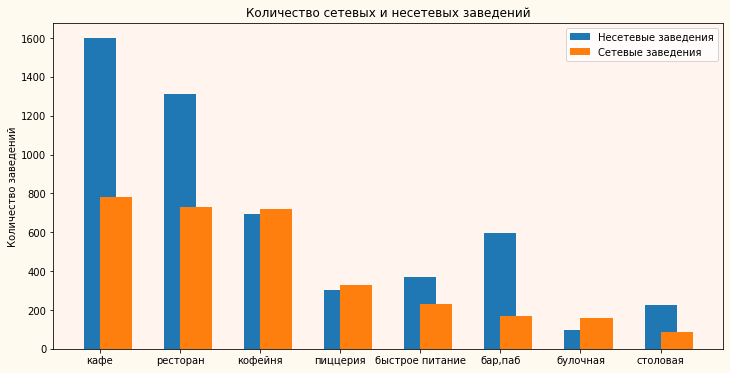

In [18]:
fig, ax = plt.subplots()

ax.bar(chain['type'], chain['not_chain'], width = 0.4, label = 'Несетевые заведения')
ax.bar(chain['type'], chain['chain'], width = 0.4, align='edge', label = 'Сетевые заведения')


ax.set_facecolor('seashell')
ax.set_ylabel('Количество заведений')
ax.set_title('Количество сетевых и несетевых заведений')
ax.legend()
fig.set_figwidth(12)
fig.set_figheight(6)
fig.set_facecolor('floralwhite')


plt.show()

**Вывод**

Процент несетевых заведений общественного питания в Москве составляет почти 62% от общего числа заведений. Для большинства типов заведений(кафе, ресторан, быстрое питание, бар/паб, столовая) количество несетевых заведений превышает количество сетевых.
Количество сетевых заведений незначительно больше, чем несетевых для кофейни, пицерии и существенно больше для булочной. 

Сгруппируем данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Ответим на следуюие вопросы:
- Знакомы ли вам эти сети?
- Есть ли какой-то признак, который их объединяет?
- К какой категории заведений они относятся?

In [19]:
name_grouped = pd.pivot_table(data,
               index=['name', 'category'],
               values=['address'],
               aggfunc=[len]
                     ).reset_index()

name_grouped.columns = ['name', 'category', 'quantity']
name_grouped = name_grouped.sort_values(by='quantity', ascending=False).head(20)
name_grouped

,name,category,quantity
3087,Кафе,кафе,159
5943,Шоколадница,кофейня,119
2750,Домино'с Пицца,пиццерия,76
2714,Додо Пицца,пиццерия,74
1214,One Price Coffee,кофейня,71
6019,Яндекс Лавка,ресторан,69
433,Cofix,кофейня,65
1362,Prime,ресторан,49
3011,КОФЕПОРТ,кофейня,42
3529,Кулинарная лавка братьев Караваевых,кафе,39


- Чтобы в финальный список не попали заведения, которые явно не являются сетевыми. Удалим заведения с названиеми: "Кафе", "Ресторан", "Шаурма", "Чайхана"

In [20]:
name_grouped = name_grouped[~name_grouped['name'].isin(['Кафе', 'Ресторан', 'Шаурма', 'Чайхана', 'Столовая'])].head(15).reset_index()
name_grouped = name_grouped[['name', 'category', 'quantity']]
name_grouped

,name,category,quantity
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


In [21]:
fig = px.bar(name_grouped.sort_values(by='quantity', ascending=False), x='quantity', y='name', color='category')

fig.update_layout(title='топ-15 популярных сетей',
                  width=600,
                  height=400,
                  xaxis_title='Количество заведений в Москве',
                  yaxis_title='Название заведения/сети')
fig.show()

**Вывод**

Наибольшее количество в топ-15 сетевых завдений Москвы приходится на кофейни. Большая часть заведений знакома и их названия на слуху. Но важно отметить, что в топ-15 не вошло ряд заведений быстрого питания, которые кажутся достаточно распространнеными, такие как: mcdonald's, KFC, Burger King. Следует уточнить этот момент с командой. Возможно, есть проблемы с данными.

Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. Проиллюстрируем эту информацию одним графиком.

In [22]:
district_grouped = pd.pivot_table(data,
               index=['district', 'category'],
               values=['name'],
               aggfunc=[len]
                     ).reset_index()

district_grouped.columns = ['district', 'category', 'quantity']
district_grouped

,district,category,quantity
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [23]:
district = pd.pivot_table(district_grouped,
               index=['district'],
               values=['quantity'],
               aggfunc=np.sum
                     ).reset_index()
district

,district,quantity
0,Восточный административный округ,798
1,Западный административный округ,851
2,Северный административный округ,900
3,Северо-Восточный административный округ,891
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


In [24]:
district_grouped = district_grouped.merge(district, how='outer', left_on='district', right_on='district')
district_grouped.columns = ['district', 'category', 'quantity', 'total']
district_grouped

,district,category,quantity,total
0,Восточный административный округ,"бар,паб",53,798
1,Восточный административный округ,булочная,25,798
2,Восточный административный округ,быстрое питание,71,798
3,Восточный административный округ,кафе,272,798
4,Восточный административный округ,кофейня,105,798
...,...,...,...,...
67,Южный административный округ,кафе,264,892
68,Южный административный округ,кофейня,131,892
69,Южный административный округ,пиццерия,73,892
70,Южный административный округ,ресторан,202,892


In [25]:
fig = px.bar(district_grouped, x='district', y='quantity', color='category')

fig.update_layout(title='Распределение заведений по районам Москвы',
                  width=620,
                  height=500,
                  xaxis_title='районы Москвы',
                  yaxis_title='Количество заведений')
fig.show()

**Вывод**

Наибольшее количество заведений расположено в Центральном административном округе. Общее количество заведений составляет более 2000. Наибольшее количество заведений в таких категориях, как рестораны, кафе, кафейня, бар.
Наименьшее количество заведений расположено в Северо-Западном административном округе.
Отметим, что в Центральном административном районе существенно выше количество баров/пабов, чем в других районах. А вот количество заведений быстрого питания в центральном районе сопоставимо с количеством в других районах, кроме Северо-Западного административного округа, в которм оно ниже почти 3 раза.

Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [26]:
rating_grouped = pd.pivot_table(data,
               index=['category'],
               values=['rating'],
               aggfunc=np.mean
                     ).reset_index()
rating_grouped

,category,rating
0,"бар,паб",4.387712
1,булочная,4.268359
2,быстрое питание,4.050249
3,кафе,4.123886
4,кофейня,4.277282
5,пиццерия,4.301264
6,ресторан,4.290357
7,столовая,4.211429


In [27]:
fig = px.bar(rating_grouped, x='category', y='rating', color='category')

fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  width=620,
                  height=400,
                  xaxis_title='Категории заведений',
                  yaxis_title='Средний рейтинг')
fig.show()

**Вывод**

Средний рейтинг для большинства категорий не сильно отличается.
Можно выделить, что средний рейтинг для заведений из категории "быстрое питание" составляет 4.0, что является самым низким рейтингом.
Самым высокий средний(4.4) рейтинг у баров/пабов.
Средний рейтинг для категорий: "булочная", "кофейня", "ресторан", "пиццерия" составляет 4.3.
Средний рейтинг для столовых немного ниже 4.2 и еще немного ниже рейтинг у кафе 4.1.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [28]:
rating_district = data.groupby('district', as_index=False)['rating'].agg('median')
rating_district

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [29]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод**

Наиболее высокий средний рейтинг у заведений в Центральном административном округе, а наиболее низкий в Северо-Восточном и Юго-Восточном округах.

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [30]:
moscow_lat, moscow_lng = 55.751244, 37.618423


m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

m

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Проиллюстрируем эту информацию одним графиком.

In [31]:
top_street = data.groupby('street', as_index=False)['name'].agg('count').sort_values(by='name', ascending=False).head(15)
top_street.columns = ['street', 'total']
top_street

,street,total
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [32]:
street_grouped = pd.pivot_table(data,
               index=['street', 'category'],
               values=['name'],
               aggfunc=[len]
                     ).reset_index()

street_grouped.columns = ['street', 'category', 'quantity']
street_grouped = top_street.merge(street_grouped, how='left', left_on='street', right_on='street')
street_grouped

,street,total,category,quantity
0,проспект Мира,184,"бар,паб",12
1,проспект Мира,184,булочная,4
2,проспект Мира,184,быстрое питание,21
3,проспект Мира,184,кафе,53
4,проспект Мира,184,кофейня,36
...,...,...,...,...
106,Пятницкая улица,48,быстрое питание,2
107,Пятницкая улица,48,кафе,7
108,Пятницкая улица,48,кофейня,6
109,Пятницкая улица,48,пиццерия,3


In [33]:
fig = px.bar(street_grouped, x='street', y='quantity', color='category')

fig.update_layout(title='Распределение заведений по топ-15 улицам',
                  width=620,
                  height=500,
                  xaxis_title='Название улиц',
                  yaxis_title='Количество заведений')
fig.update_xaxes(tickangle=-45)
fig.show()

**Вывод**

Из топ-15 больше всего заведений на проспекте Мира, а меньшего всего на Пятницкой улице.

Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [34]:
one_street = data.groupby('street', as_index=False)['name'].agg('count').sort_values(by='name')
one_street.columns = ['street', 'total']
one_street = one_street[one_street['total'] == 1]
one_street

,street,total
0,1-й Автозаводский проезд,1
683,Одинцовская улица,1
689,Октябрьский переулок,1
694,Ордынский тупик,1
695,Оренбургская улица,1
...,...,...
124,3-й Хорошёвский проезд,1
217,Бобров переулок,1
218,Богословский переулок,1
138,4-й Лесной переулок,1


In [35]:
one_grouped = pd.pivot_table(data,
               index=['street', 'category'],
               values=['name'],
               aggfunc=[len]
                     ).reset_index()

one_grouped.columns = ['street', 'category', 'quantity']
one_grouped = one_street.merge(one_grouped, how='left', left_on='street', right_on='street')


one_grouped = one_grouped.groupby('category').agg('count').sort_values(by='quantity', ascending=False).reset_index()
one_grouped = one_grouped[['category', 'total']]
one_grouped

,category,total
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


In [36]:
fig = px.bar(one_grouped, x='category', y='total', color='category')

fig.update_layout(title='Распределение заведений на улицах с одним заведением',
                  width=620,
                  height=400,
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество')
fig.show()

**Вывод**

По одному заведению находится на 458 улицах в Москве. Из них большинство - 160 относятся к категории "кафе", а меньше всего заведений в категории "булочная" - 8 штук.

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [37]:
avg_bill_district = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
avg_bill_district

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [38]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианный средний чек в заведениях по районам',
).add_to(m)

# выводим карту
m

**Вывод**

Самый высокий средний чек в заведениях в Центральном и Западном административных округах. А самый низкий в заведениях Северо-Восточного, Юго-Восточного и Южного административных округов.

 **Общий вывод**
 - В данных отсутствуют дубликаты.
 - Есть пропуски в следующих столбцах:
     - hours
     - price
     - avg_bill
     - middle_avg_bill
     - middle_coffee_cup
     - seats
Пропущенные значения не заполняем, так как данные параметры добавляются самостоятельно пользователями на сервисе Яндекс Бизнес и не могут быть добавлены исходя из имеющихся данных.
 - По количеству заведений лидирует категория - "кафе". Их в Москве насчитывается 2378 штук, что составляет 28,3% от общего количества заведений общественного питания в городе.
 - На втором месте находится категория - "ресторан" с количеством 2043, что составляет 24,3%.
 - На третьем месте - "кофейня" с количеством 1413, что составляет 16,8%.
 - Количество заведений категории "бар/паб" составляет 765 и составляет 9,1%.
 - Заведения категорий "пиццерия" и "быстрое питание" составляют 633(7,53%) и 603(7,17%), соответственно.
 - Минимальное количество заведений в категориях "столовая" - 315(3,75%) и "булочная" - 256(3,05%).
 - Медианное количество мест в различных типах заведений составляет от 86 для ресторанов до 50 для булочных.
 - Процент несетевых заведений общественного питания в Москве составляет почти 62% от общего числа заведений. Для большинства типов заведений(кафе, ресторан, быстрое питание, бар/паб, столовая) количество несетевых заведений превышает количество сетевых. Количество сетевых заведений незначительно больше, чем несетевых для кофейни, пицерии и существенно больше для булочной.
 - При формировании топ-15 самых популярных сетевых заведений(с максимальным количеством заведений сети в Москве). Наибольшее количество приходится на кофейни. Большая часть заведений знакома и их названия на слуху. Но важно отметить, что в топ-15 не вошло ряд заведений быстрого питания, которые кажутся достаточно распространнеными, такие как: mcdonald's, KFC, Burger King. Следует уточнить этот момент с командой. Возможно, есть проблемы с данными.
 -  Наибольшее количество заведений расположено в Центральном административном округе. Общее количество заведений составляет более 2000. Наибольшее количество заведений в таких категориях, как рестораны, кафе, кафейня, бар. Наименьшее количество заведений расположено в Северо-Западном административном округе. Отметим, что в Центральном административном районе существенно выше количество баров/пабов, чем в других районах. А вот количество заведений быстрого питания в центральном районе сопоставимо с количеством в других районах, кроме Северо-Западного административного округа, в которм оно ниже почти 3 раза.
 - Средний рейтинг для большинства категорий не сильно отличается. Можно выделить, что средний рейтинг для заведений из категории "быстрое питание" составляет 4.0, что является самым низким рейтингом. Самым высокий средний(4.4) рейтинг у баров/пабов. Средний рейтинг для категорий: "булочная", "кофейня", "ресторан", "пиццерия" составляет 4.3. Средний рейтинг для столовых немного ниже 4.2 и еще немного ниже рейтинг у кафе 4.1.
 - При рассмотрении распределения среднего рейтинга по районам Москвы можем отметить, что наиболее высокий средний рейтинг у заведений в Центральном административном округе, а наиболее низкий в Северо-Восточном и Юго-Восточном округах.
 - Если выделить топ-15 с самым большим количеством заведений в Москве, то в него войдут следующие улицы: проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект, Дмитровское шоссе, 	Каширское шоссе, Варшавское шоссе, Ленинградское шоссе, МКАД, Люблинская улица, улица Вавилова,	Кутузовский проспект, улица Миклухо-Маклая, Пятницкая улица. Количество заведений на этих улицах составляет от 48(Пятницкая улица) до 184(проспект Мира).
 - По одному заведению находится на 458 улицах в Москве. Из них большинство - 160 относятся к категории "кафе", а меньше всего заведений в категории "булочная" - 8 штук.
 - Самый высокий средний чек в заведениях в Центральном и Западном административных округах. А самый низкий в заведениях Северо-Восточного, Юго-Восточного и Южного административных округов.

### Детализируем исследование: открытие кофейни

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

Из ранее проведеннного исследования известно, что кофеен всего в городе - 1413, что составляет 16.8% от общего количества заведений в Москве. Количество сетевых кофеен составляет 720, а несетевых - 693.
Рассмотрим подробно распределение кофеен по районам.

In [39]:
ch_data = data[data['category'] =='кофейня']
ch_data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
8365,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,Волгоградский проспект,False
8376,Шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
8385,Cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,Новохохловская улица,False


In [40]:
ch_district = pd.pivot_table(ch_data,
               index=['district'],
               values=['name'],
               aggfunc=[len]
                     ).reset_index()

ch_district.columns = ['district', 'quantity']
fig = px.bar(ch_district.sort_values(by='quantity', ascending=False), x='district', y='quantity')

fig.update_layout(title='Распределение кофеен по районам Москвы',
                  width=700,
                  height=500,
                  xaxis_title='районы Москвы',
                  yaxis_title='Количество кофеен')
fig.show()

**Вывод**

Самое большое количество(428 штук) кофеен находится в Центральном административном округе, а меньше всего в Северо-Западном административном округе.

Рассмотрим количество кофеен на топ-15 улиц с самым большим количеством заведений. Рассчитаем долю кофеен от общего числа заведений.

In [41]:
ch_street = street_grouped[street_grouped['category'] == 'кофейня']
ch_street

,street,total,category,quantity
4,проспект Мира,184,кофейня,36
12,Профсоюзная улица,122,кофейня,18
20,проспект Вернадского,108,кофейня,16
28,Ленинский проспект,107,кофейня,23
36,Ленинградский проспект,95,кофейня,25
44,Дмитровское шоссе,88,кофейня,11
51,Каширское шоссе,77,кофейня,16
58,Варшавское шоссе,76,кофейня,14
66,Ленинградское шоссе,70,кофейня,13
73,МКАД,65,кофейня,4


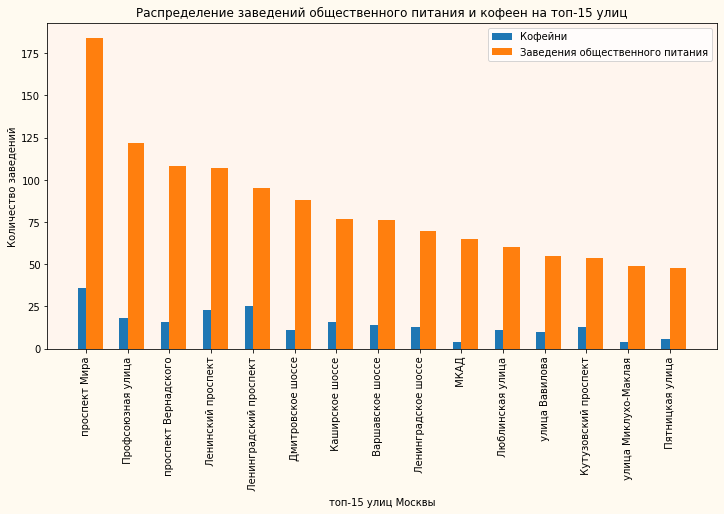

In [42]:
fig, ax = plt.subplots()

ax.bar(ch_street['street'], ch_street['quantity'], width = 0.4, label = 'Кофейни')
ax.bar(ch_street['street'], ch_street['total'], width = 0.4, align='edge', label = 'Заведения общественного питания')


ax.set_facecolor('seashell')
ax.set_ylabel('Количество заведений')
ax.set_xlabel('топ-15 улиц Москвы')
plt.xticks(rotation=90)
ax.set_title('Распределение заведений общественного питания и кофеен на топ-15 улиц')
ax.legend()
fig.set_figwidth(12)
fig.set_figheight(6)
fig.set_facecolor('floralwhite')


plt.show()

**Вывод**

Топ-15 улиц с самым большим количеством ресторанов предполагает самую высокую проходимость. Рассматривая общее количество заведений на этих улицах в соотношении с количеством уже имеющихся кофеен выбираем улицы с минимальной долей кофеен:
- улица Миклухо-Маклая
- Пятницкая улица
- Дмитровское шоссе
- Профсоюзная улица
- проспект Вернадского

Не рассматривам МКАД, так как формат кафе предполагает удобную транспортную или пешеходную доступность.

Есть ли круглосуточные кофейни?

In [43]:
open_24 = ch_data[ch_data['is_24/7'] == True]
open_24

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
200,Wild Bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,Дмитровское шоссе,True
971,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,Ярославское шоссе,True
1047,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,Ярославское шоссе,True
1214,Wild Bean Cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,МКАД,True
1291,Шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица Народного Ополчения,True
1468,Кофе Хауз,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,Ленинградский проспект,True
1790,Кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,Ленинградский проспект,True
1825,You&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица Золоторожский Вал,True
1883,Кофемания,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,Лесная улица,True
2030,Cinnabon,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,Долгоруковская улица,True


In [44]:
print('Количество круглосуточных кофеен равно', open_24['name'].count())

Количество круглосуточных кофеен равно 59


Рассмотрим распределение круглосуточных кофеен по район Москвы.

In [45]:
open_24_district = pd.pivot_table(open_24,
               index=['district'],
               values=['name'],
               aggfunc=[len]
                     ).reset_index()

open_24_district.columns = ['district', 'quantity']
fig = px.bar(open_24_district.sort_values(by='quantity', ascending=False), x='district', y='quantity')

fig.update_layout(title='Распределение круглосуточных кофеен по районам Москвы',
                  width=700,
                  height=500,
                  xaxis_title='районы Москвы',
                  yaxis_title='Количество кофеен')
fig.show()

- Круглосуточных кофеен гораздо меньше, чем некруглосуточных даже в Центральном административном округе. Формат кофейни в котором можно встретиться с друзьями для такого неспящего города как Москва вполне накладывается на круглосуточный режим работы. Особенно, с учетом их небольшого числа в Центральном административном округе.

- Какие у кофеен рейтинги? Как они распределяются по районам?

In [46]:
ch_data_grouped = pd.pivot_table(ch_data,
               index=['district'],
               values=['rating'],
               aggfunc=np.mean
                     ).reset_index()
ch_data_grouped['rating'] = round(ch_data_grouped['rating'], 2)
ch_data_grouped

,district,rating
0,Восточный административный округ,4.28
1,Западный административный округ,4.20
2,Северный административный округ,4.29
3,Северо-Восточный административный округ,4.22
4,Северо-Западный административный округ,4.33
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.23
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23


In [47]:
fig = px.bar(ch_data_grouped.sort_values(by='rating', ascending=False), x='district', y='rating')

fig.update_layout(title='Распределение круглосуточных кофеен по районам Москвы',
                  width=700,
                  height=500,
                  xaxis_title='районы Москвы',
                  yaxis_title='Средний рейтинг')
fig.show()

**Вывод**

Медианный рейтинг у кофеен по всем районам колеблется от 4.20 до 4.34
Самый высокий медианный рейтинг 4.34 в Центральном административном округе, а самый низкий - 4.20 для Западного административного округа.

- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [48]:
print('Средняя цена чашки кофе в кофейнях -', round(ch_data['middle_coffee_cup'].mean(), 2))

Средняя цена чашки кофе в кофейнях - 175.06


In [49]:
print('Средняя цена чашки кофе в круглосуточных кофейнях -', round(open_24['middle_coffee_cup'].mean(), 2))

Средняя цена чашки кофе в круглосуточных кофейнях - 225.73


**Вывод**

Для круглосуточной кофейни следует ориентироваться на стоимость чашки кофе в 200 рублей, так как это будет дешевле, чем в среднем в круглосуточных кофейнях и может стать решающим фактором при выборе кофейни при других равных параметрах.

Презентация https://disk.yandex.ru/i/K2moNXTmJD64bw